In [10]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
#import umap
import pandas as pd

In [12]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [13]:
DATASET_ID = 'european_starling_gentner_segmented'

In [14]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [15]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [16]:
hparams = HParams(
    num_mel_bins = 128,
    mel_lower_edge_hertz=500,
    mel_upper_edge_hertz=20000,
    butter_lowcut = 500,
    butter_highcut = 20000,
    ref_level_db = 20,
    min_level_db = -45,
    mask_spec = True,
    win_length_ms = 10,
    hop_length_ms = 2,
    nex=-1,
    n_jobs=-1,
    verbosity = 1,
)

In [17]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 191 tasks      | elapsed:    5.6s


[Parallel(n_jobs=-1)]: Done 3805 out of 3805 | elapsed:    6.1s finished


In [18]:
dataset.sample_json

OrderedDict([('species', 'Lonchura striata domestica'),
             ('common_name', 'Sturnus vulgaris'),
             ('indvs',
              OrderedDict([('b1077',
                            OrderedDict([('syllables',
                                          OrderedDict([('start_times',
                                                        [16.338]),
                                                       ('end_times',
                                                        [16.509])]))]))])),
             ('datetime', '2017-12-18_10-39-28'),
             ('samplerate_hz', 44100),
             ('length_s', 26.09),
             ('wav_loc',
              '/mnt/cube/Datasets/starling_zenodo/b1077/wavs/2017-12-18_10-39-28-170000.wav')])

In [19]:
len(dataset.data_files)

3805

#### Create dataset based upon JSON

In [20]:
from joblib import Parallel, delayed
n_jobs = -1; verbosity = 10

In [21]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=[],
            unit="syllables",
            dict_features_to_retain = [],
            key = key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1973s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1404s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 119 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 195 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    1.8s
[Parallel(n_j

164230

In [22]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key
0,16.338,16.509,b1077,0,2017-12-18_10-39-28-170000
0,5.540,5.756,b1060,0,2017-12-08_16-45-25-480000
1,6.102,7.473,b1060,0,2017-12-08_16-45-25-480000


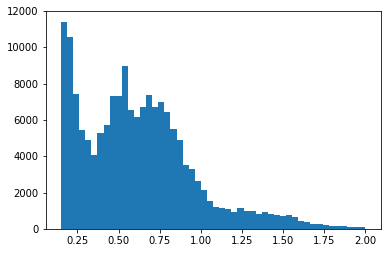

In [38]:
plt.hist(syllable_df.end_time - syllable_df.start_time, bins=50);

### get audio for dataset

In [23]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(get_row_audio)(
            syllable_df[syllable_df.key == key], 
            dataset.data_files[key].data['wav_loc'], 
            dataset.hparams
        )
        for key in tqdm(syllable_df.key.unique())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 194 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done 3731 out of 3731 | elapsed:  2.5min finished


164230

In [24]:
df_mask  = np.array([len(i) > 0 for i in tqdm(syllable_df.audio.values)])

In [25]:
syllable_df = syllable_df[np.array(df_mask)]

In [26]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate
0,16.338,16.509,b1077,0,2017-12-18_10-39-28-170000,"[-0.08710080287567226, -0.09921707685754419, -...",44100
0,5.540,5.756,b1060,0,2017-12-08_16-45-25-480000,"[-0.002728084309892505, -0.0025438502995544627...",44100
1,6.102,7.473,b1060,0,2017-12-08_16-45-25-480000,"[0.001025137118730377, 0.0009614843954848411, ...",44100


In [27]:
sylls = syllable_df.audio.values

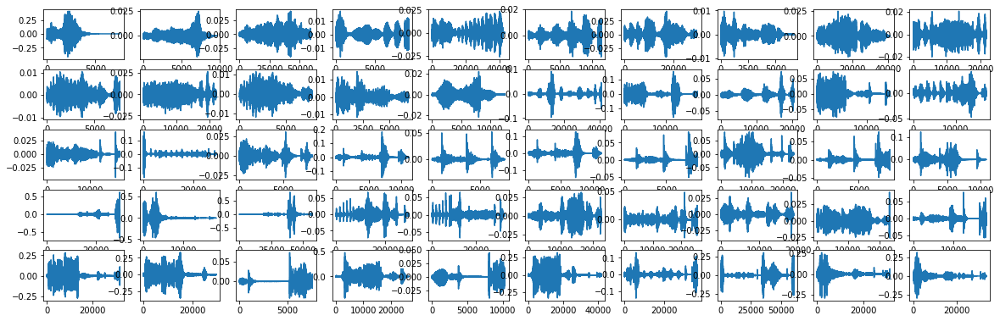

In [28]:
nrows = 5
ncols = 10
zoom = 2
fig, axs = plt.subplots(ncols=ncols, nrows = nrows,figsize = (ncols*zoom, nrows+zoom/1.5))
for i, syll in tqdm(enumerate(sylls), total = nrows*ncols):
    ax = axs.flatten()[i]
    ax.plot(syll)
    if i == nrows*ncols -1:
        break

In [29]:
syllable_df['audio'] = [i/np.max(i) for i in syllable_df.audio.values]

### Create spectrograms

In [30]:
from avgn.visualization.spectrogram import draw_spec_set
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram

In [31]:
syllables_wav = syllable_df.audio.values
syllables_rate = syllable_df.rate.values

In [32]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    # create spectrograms
    syllables_spec = parallel(
        delayed(make_spec)(
            syllable,
            rate,
            hparams=dataset.hparams,
            mel_matrix=dataset.mel_matrix,
            use_mel=True,
            use_tensorflow=False,
        )
        for syllable, rate in tqdm(
            zip(syllables_wav, syllables_rate),
            total=len(syllables_rate),
            desc="getting syllable spectrograms",
            leave=False,
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0616s.) Setting batch_size=6.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1655s.) Setting batch_size=14.
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 350 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 588 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 854 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 1414 tasks      | elapsed:    2.0s
[Parallel(

[Parallel(n_jobs=-1)]: Done 125902 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 127792 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 129710 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 131628 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 133574 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 135520 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 137494 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 139468 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 141470 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 143472 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 145502 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 147532 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 149590 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 151648 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 153734 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Do

[Parallel(n_jobs=-1)]: Done 164228 out of 164228 | elapsed:  3.2min finished


In [52]:
del syllable_df['audio']

### Rescale spectrogram
- using log rescaling

In [33]:
np.shape(syllables_spec[0])

(128, 86)

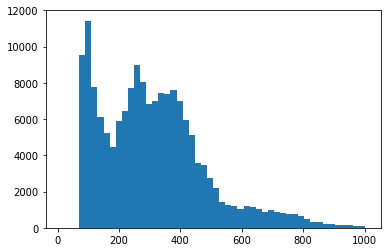

In [37]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
plt.hist(syll_lens, bins=50);

In [35]:
np.max(syll_lens), np.min(syll_lens)

(1002, 11)

In [39]:
df_mask  = (np.array(syll_lens) > 200) & (np.array(syll_lens) < 550)

In [40]:
syllable_df = syllable_df[np.array(df_mask)]
len(syllable_df)

In [45]:
syllables_spec = [i for i,j in zip(syllables_spec, df_mask) if j]

In [47]:
128 / 550

0.23272727272727273

In [46]:
len(syllables_spec)

101726

In [51]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))
syllables_spec = [(norm(i)*255).astype('uint8') for i in tqdm(syllables_spec)]

In [58]:
from PIL import Image

def resize_spec(spec, scaling_factor=10):
    resize_shape = [int(np.shape(spec)[1] * scaling_factor), np.shape(spec)[0]]
    resize_spec = np.array(Image.fromarray(spec).resize(resize_shape, Image.ANTIALIAS))
    return resize_spec

In [59]:
rescale_factor = 0.23

In [62]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllables_spec = parallel(
        delayed(resize_spec)(spec, scaling_factor=rescale_factor)
        for spec in tqdm(syllables_spec, desc="scaling spectrograms", leave=False)
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0433s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 304 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 440 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 576 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 728 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 880 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 1048 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 1216 tasks      | elapsed:   25.4s
[Parallel(n_jobs=-1)]: Done 1400

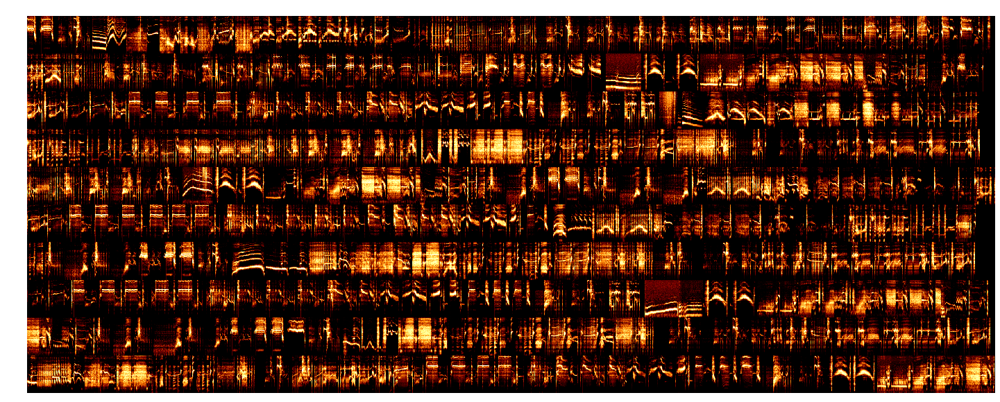

In [63]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

### Pad spectrograms

In [64]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
pad_length = np.max(syll_lens)

In [70]:
pad_length= 128

In [65]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,rate
3,8.110,9.092,b1060,0,2017-12-08_16-45-25-480000,44100
5,9.780,10.453,b1060,0,2017-12-08_16-45-25-480000,44100
7,10.725,11.656,b1060,0,2017-12-08_16-45-25-480000,44100


In [66]:
import seaborn as sns

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


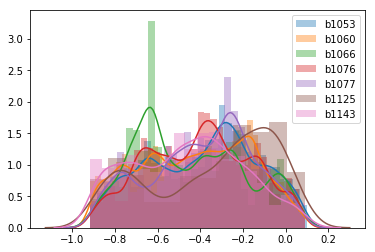

In [67]:
for indv in np.unique(syllable_df.indv):
    sns.distplot(np.log(syllable_df[syllable_df.indv==indv]["end_time"] - syllable_df[syllable_df.indv==indv]["start_time"]), label=indv)
plt.legend()

In [71]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:

    syllables_spec = parallel(
        delayed(pad_spectrogram)(spec, pad_length)
        for spec in tqdm(
            syllables_spec, desc="padding spectrograms", leave=False
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    9.9s
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopp

[Parallel(n_jobs=-1)]: Done 514 tasks      | elapsed:   43.2s
[Parallel(n_jobs=-1)]: Done 974 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done 2064 tasks      | elapsed:   43.7s
[Parallel(n_jobs=-1)]: Done 3614 tasks      | elapsed:   44.0s
[Parallel(n_jobs=-1)]: Done 5164 tasks      | elapsed:   44.3s
[Parallel(n_jobs=-1)]: Done 6777 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 8451 tasks      | elapsed:   44.9s
[Parallel(n_jobs=-1)]: Done 10249 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Done 12047 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done 13927 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 15849 tasks      | elapsed:   46.2s
[Parallel(n_jobs=-1)]: Done 17895 tasks      | elapsed:   46.5s
[Parallel(n_jobs=-1)]: Done 19941 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done 22111 tasks      | elapsed:   47.2s
[Parallel(n_jobs=-1)]: Done 24281 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 26575 tasks      | el

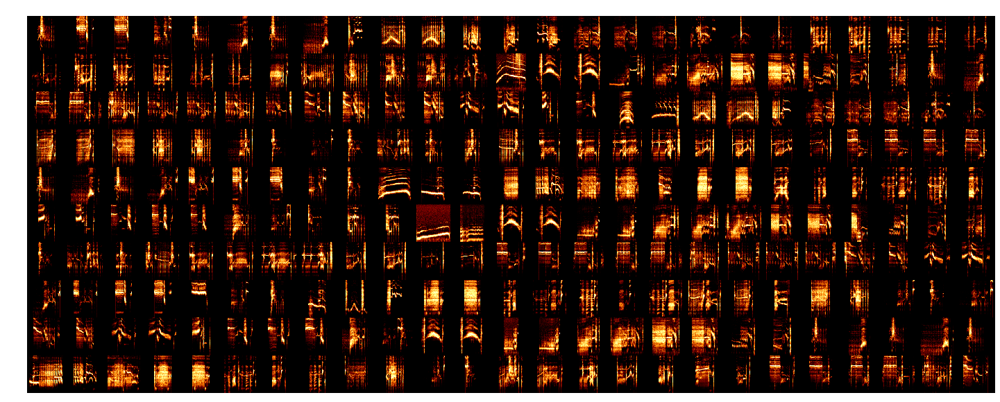

In [72]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

In [73]:
np.shape(syllables_spec)

(101726, 128, 128)

In [74]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))
syllables_spec = [(norm(i)*255).astype('uint8') for i in tqdm(syllables_spec)]

In [75]:
# convert to uint8 to save space
syllable_df['spectrogram'] = syllables_spec

In [76]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,rate,spectrogram
3,8.110,9.092,b1060,0,2017-12-08_16-45-25-480000,44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
5,9.780,10.453,b1060,0,2017-12-08_16-45-25-480000,44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
7,10.725,11.656,b1060,0,2017-12-08_16-45-25-480000,44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


### view syllables per indv

In [77]:
syllable_df.indv.unique()

array(['b1060', 'b1066', 'b1077', 'b1053', 'b1076', 'b1125', 'b1143'],
      dtype=object)

b1053 16104


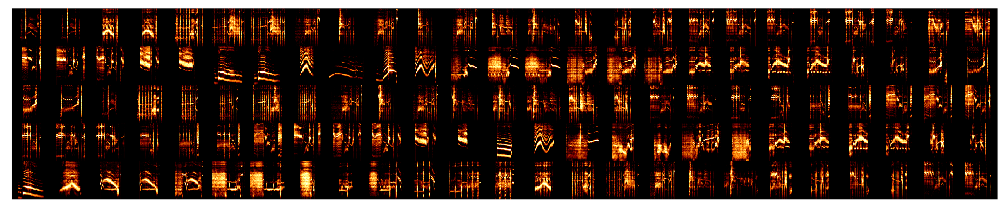

b1060 41452


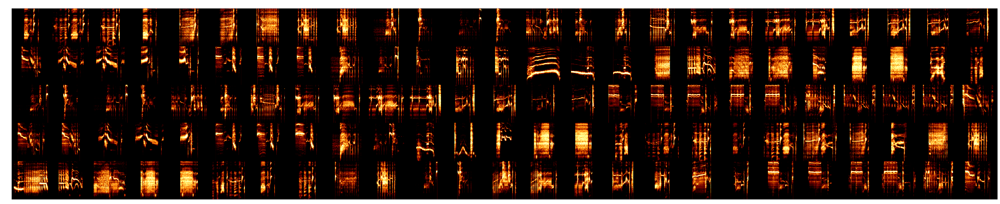

b1066 12780


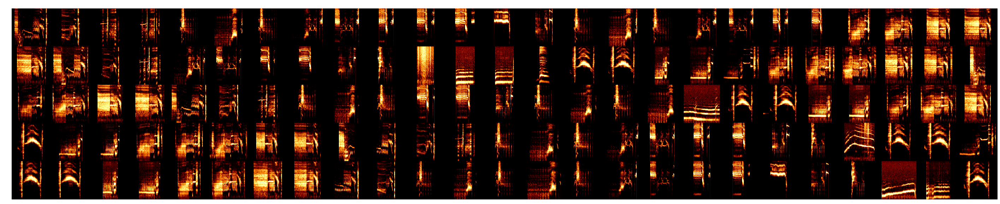

b1076 16870


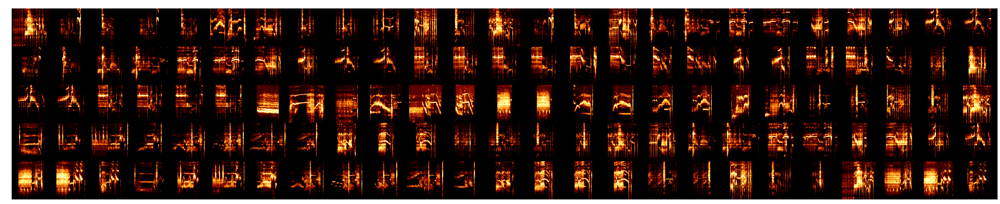

b1077 10191


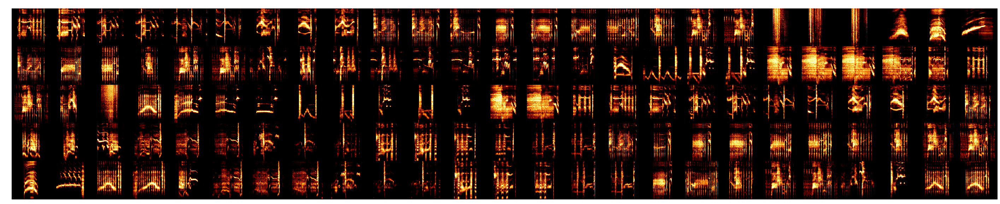

b1125 1688


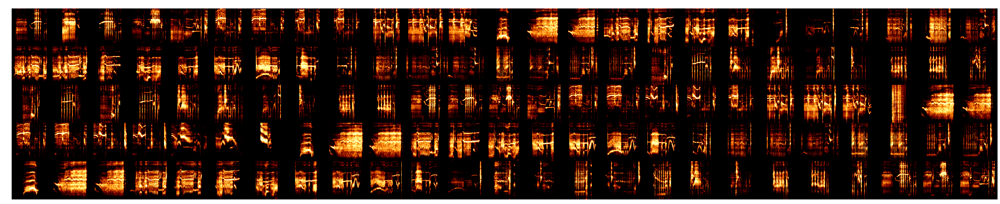

b1143 2641


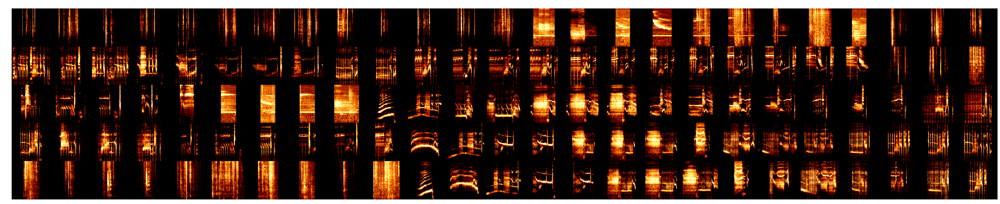

In [78]:
for indv in np.sort(syllable_df.indv.unique()):
    print(indv, np.sum(syllable_df.indv == indv))
    specs = np.array([i/np.max(i) for i in syllable_df[syllable_df.indv == indv].spectrogram.values])
    specs[specs<0] = 0
    draw_spec_set(specs, zoom=2,
                  maxrows=5, 
                  colsize=25)

In [79]:
len(syllable_df)

101726

### save dataset

In [81]:
save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'starling_128.pickle'
ensure_dir(save_loc)
syllable_df.to_pickle(save_loc)